In [1]:
import torch
import torch.nn as nn
from torchvision.datasets import MNIST
from torchvision.transforms import transforms
import numpy as np

#import F
from torch.nn import functional as F

In [2]:
# Set device to cuda 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

Device: cuda


In [3]:
image_transform = transforms.Compose([
    transforms.Resize((128,128)),transforms.ToTensor(),transforms.Lambda(lambda x : x.to(device))
])

In [4]:
from torchvision import datasets

In [5]:
trainFolder = 'train'
trainDataset = datasets.ImageFolder(trainFolder, transform=image_transform)

# Select 1000 images only to train
#trainDataset = torch.utils.data.Subset(trainDataset, np.random.choice(len(trainDataset), 1000, replace=False))

validFolder = 'val'
validDataset = datasets.ImageFolder(validFolder, transform=image_transform)

# Select 100 images only to validate
#validDataset = torch.utils.data.Subset(validDataset, np.random.choice(len(validDataset), 100, replace=False))

In [6]:
print('Train dataset:', len(trainDataset))
print('Valid dataset:', len(validDataset))

Train dataset: 4739
Valid dataset: 500


In [7]:
#Import DataLoader
from torch.utils.data import DataLoader
batchSize = 64
trainLoader = DataLoader(trainDataset, batch_size=batchSize, shuffle=True)
validLoader = DataLoader(validDataset, batch_size=batchSize, shuffle=True) 

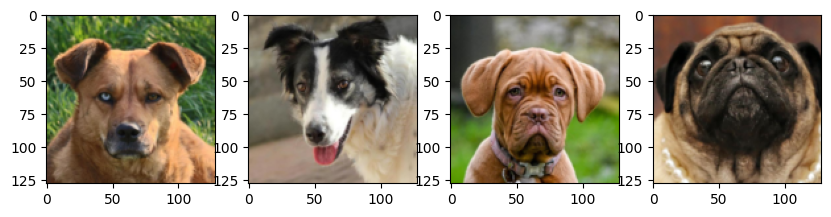

In [8]:
# print some images from the trainLoader
import matplotlib.pyplot as plt
import numpy as np
for images, labels in trainLoader:
    fig, axes = plt.subplots(figsize=(10,4), ncols=4)
    for i in range(4):
        ax = axes[i]
        ax.imshow(images[i].cpu().numpy().transpose(1,2,0).squeeze())
    break

In [9]:
class VariationalAutoEncoder(nn.Module):
    
    def __init__(self):
        super(VariationalAutoEncoder, self).__init__()
        
        # Make encoder to accept 64x64 images across 3 channels
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=2, padding=1),#64x64
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=2, padding=1),#32x32
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1),#16x16
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1),#8x8
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),#4x4
            nn.Flatten()
        )
        
        # Mean and log variance of z
        self.mean = nn.Linear(256*4*4, 256)
        self.log_var = nn.Linear(256*4*4, 256)
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(256, 256*4*4),
            nn.Unflatten(1, (256, 4, 4)),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1),#8x8
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1),#16x16
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1),#32x32
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=3, stride=2, padding=1, output_padding=1),#64x64
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=16, out_channels=3, kernel_size=3, stride=2, padding=1, output_padding=1),#128x128
            nn.Sigmoid()
        )
        
    def reparameterize(self, mean, log_var):
        std = torch.exp(0.5*log_var)
        eps = torch.randn_like(std)
        return mean + eps*std
    
    def forward(self, x):
        x = self.encoder(x)
        mean = self.mean(x)
        log_var = self.log_var(x)
        z = self.reparameterize(mean, log_var)
        x = self.decoder(z)
        return x, mean, log_var
    
            

In [10]:
from torchsummary import summary
model = VariationalAutoEncoder().to(device)

summary(model, (3, 128, 128))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 4096]                --
|    └─Conv2d: 2-1                       [-1, 16, 64, 64]          448
|    └─BatchNorm2d: 2-2                  [-1, 16, 64, 64]          32
|    └─ReLU: 2-3                         [-1, 16, 64, 64]          --
|    └─Conv2d: 2-4                       [-1, 32, 32, 32]          4,640
|    └─BatchNorm2d: 2-5                  [-1, 32, 32, 32]          64
|    └─ReLU: 2-6                         [-1, 32, 32, 32]          --
|    └─Conv2d: 2-7                       [-1, 64, 16, 16]          18,496
|    └─BatchNorm2d: 2-8                  [-1, 64, 16, 16]          128
|    └─ReLU: 2-9                         [-1, 64, 16, 16]          --
|    └─Conv2d: 2-10                      [-1, 128, 8, 8]           73,856
|    └─BatchNorm2d: 2-11                 [-1, 128, 8, 8]           256
|    └─ReLU: 2-12                        [-1, 128, 8, 8]           --
|

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 4096]                --
|    └─Conv2d: 2-1                       [-1, 16, 64, 64]          448
|    └─BatchNorm2d: 2-2                  [-1, 16, 64, 64]          32
|    └─ReLU: 2-3                         [-1, 16, 64, 64]          --
|    └─Conv2d: 2-4                       [-1, 32, 32, 32]          4,640
|    └─BatchNorm2d: 2-5                  [-1, 32, 32, 32]          64
|    └─ReLU: 2-6                         [-1, 32, 32, 32]          --
|    └─Conv2d: 2-7                       [-1, 64, 16, 16]          18,496
|    └─BatchNorm2d: 2-8                  [-1, 64, 16, 16]          128
|    └─ReLU: 2-9                         [-1, 64, 16, 16]          --
|    └─Conv2d: 2-10                      [-1, 128, 8, 8]           73,856
|    └─BatchNorm2d: 2-11                 [-1, 128, 8, 8]           256
|    └─ReLU: 2-12                        [-1, 128, 8, 8]           --
|

In [11]:
def loss_function(recon_x, x, mu, log_var):
    MSE = F.mse_loss(recon_x, x.view(-1, 3, 128, 128), reduction='sum')
    KLD = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp()) 
    return MSE + KLD

In [12]:
# initialize the model 
model = VariationalAutoEncoder().to(device)

# initialize the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

EPOCH: 1.000  train_loss: 159479.823  valid_loss: 98008.831  (13.12s - 118.06s remaining)


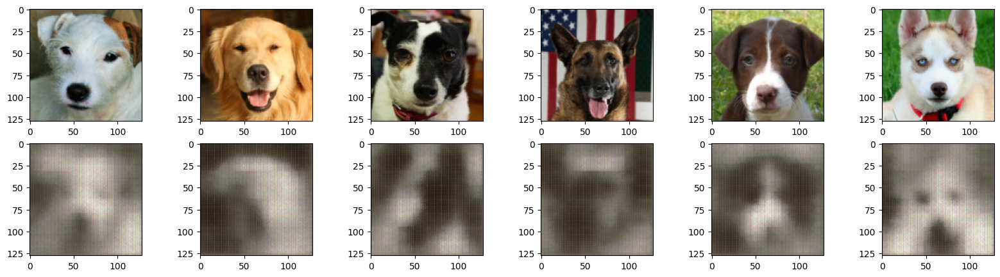

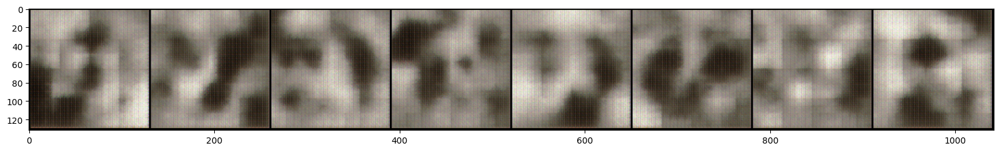

EPOCH: 2.000  train_loss: 83013.960  valid_loss: 78167.523  (25.98s - 103.94s remaining)


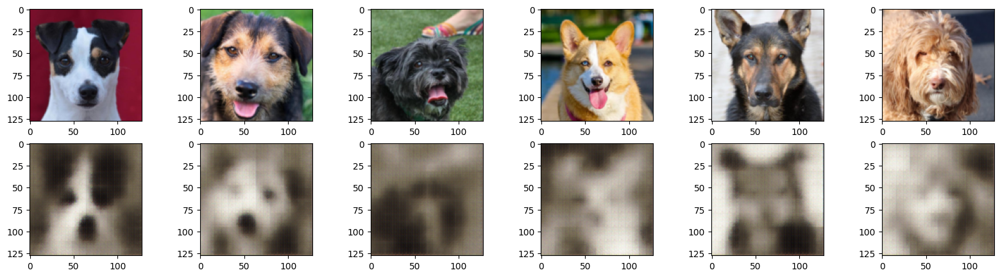

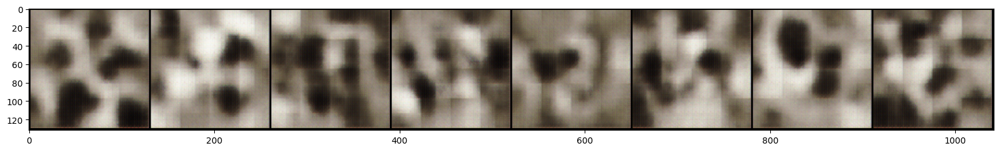

EPOCH: 3.000  train_loss: 72027.869  valid_loss: 70304.103  (39.08s - 91.18s remaining)


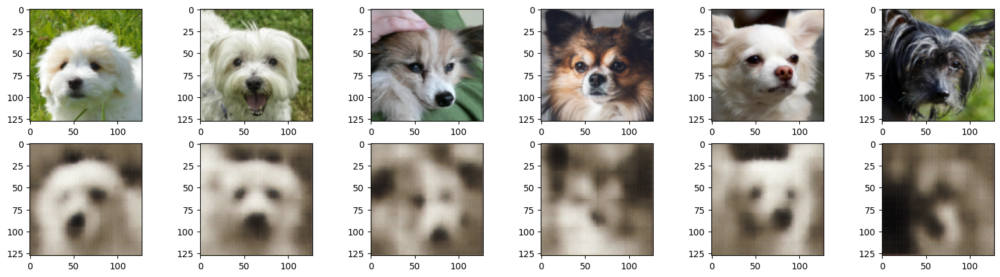

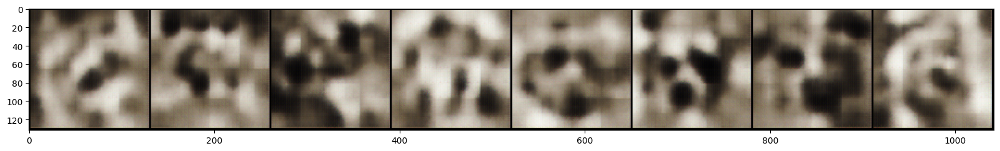

EPOCH: 4.000  train_loss: 67626.083  valid_loss: 67875.604  (50.94s - 76.40s remaining)


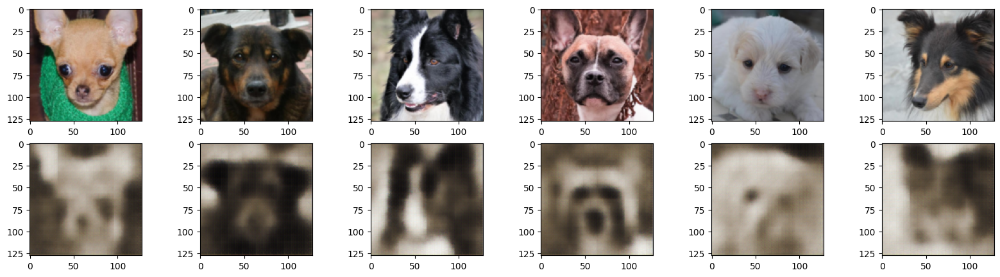

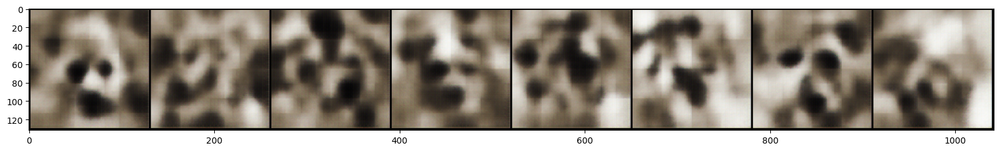

EPOCH: 5.000  train_loss: 64264.511  valid_loss: 63528.240  (63.13s - 63.13s remaining)


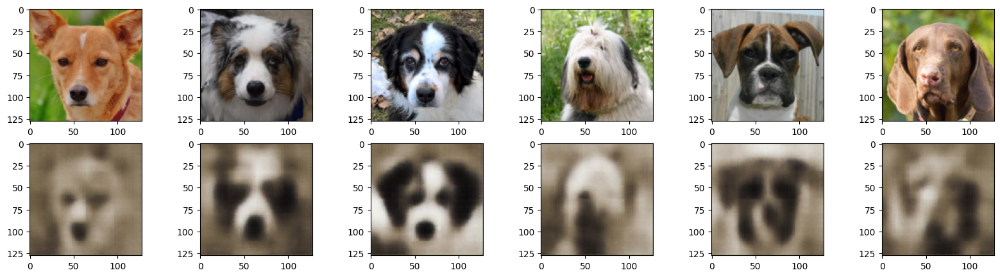

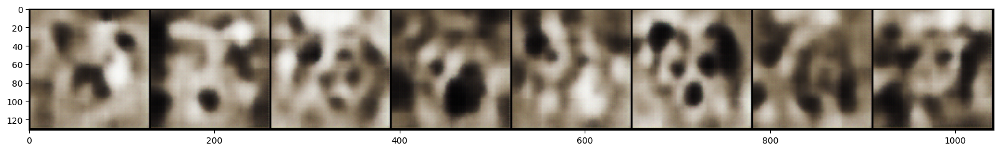

EPOCH: 6.000  train_loss: 61406.063  valid_loss: 61502.137  (75.20s - 50.13s remaining)


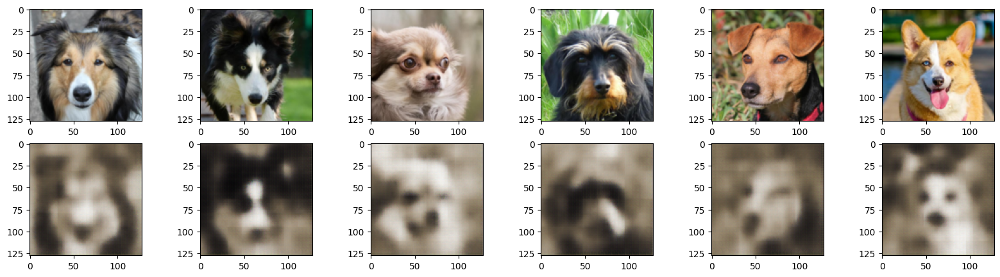

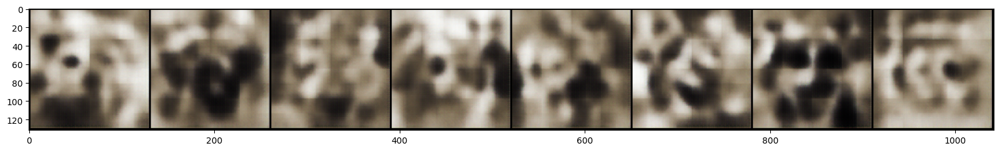

EPOCH: 7.000  train_loss: 59372.433  valid_loss: 59409.569  (87.77s - 37.62s remaining)


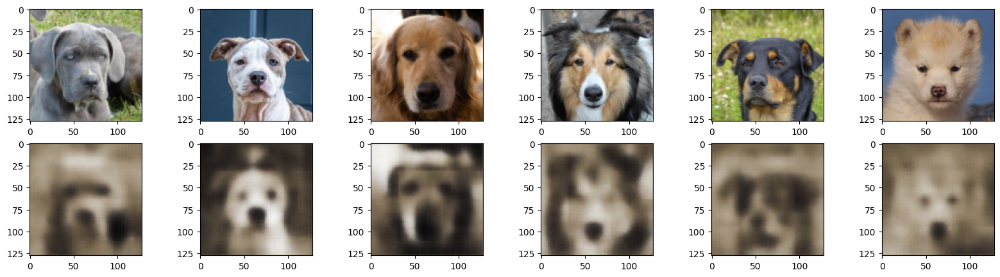

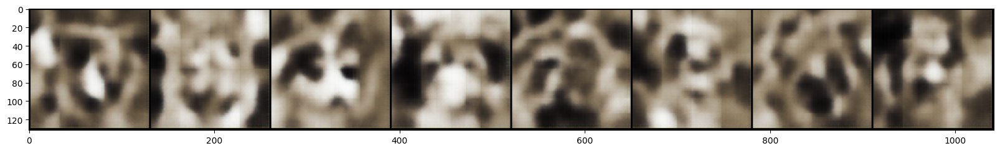

EPOCH: 8.000  train_loss: 57643.849  valid_loss: 57990.598  (100.22s - 25.06s remaining)


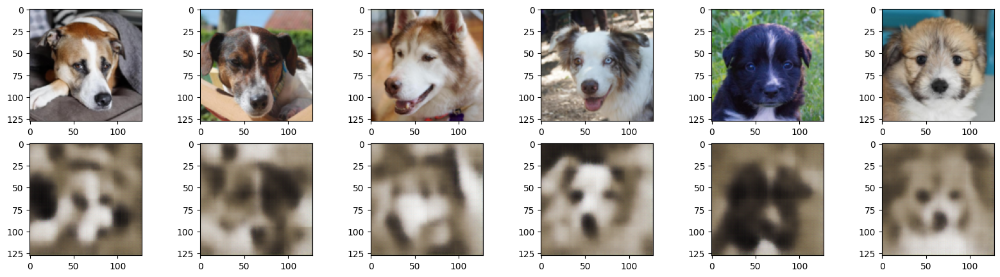

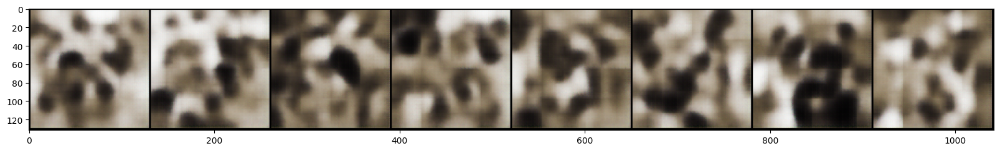

EPOCH: 9.000  train_loss: 56465.511  valid_loss: 56709.762  (113.54s - 12.62s remaining)


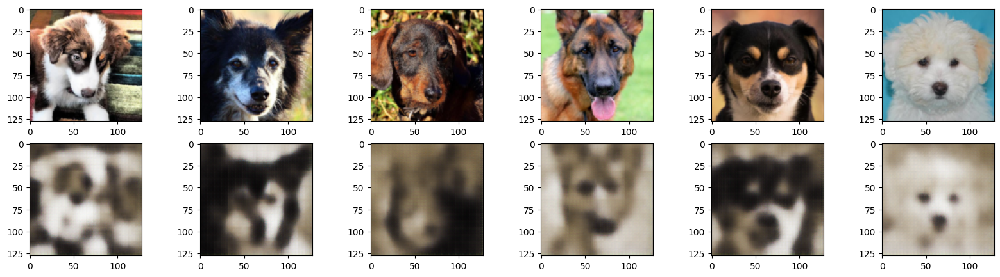

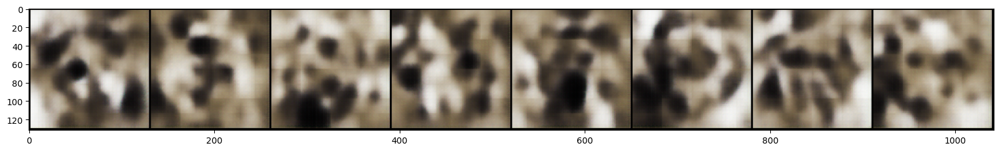

EPOCH: 10.000  train_loss: 54874.154  valid_loss: 53535.107  (126.87s - 0.00s remaining)


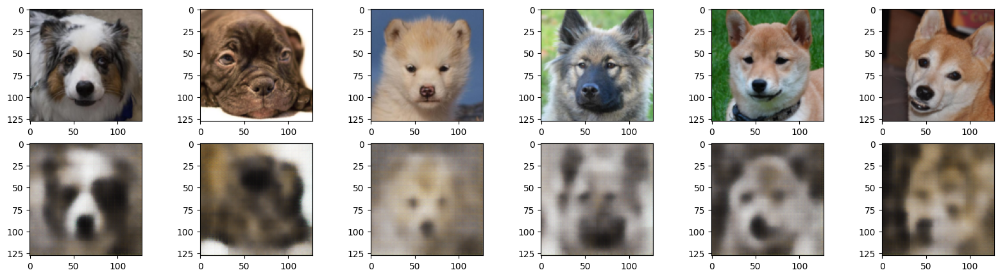

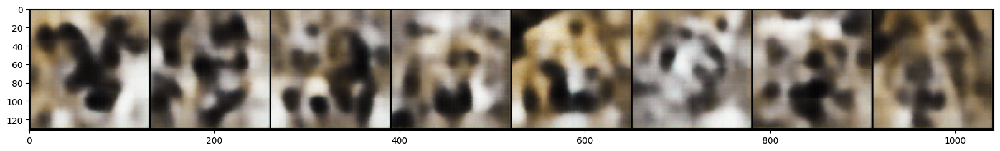

In [13]:
from torch_snippets import *
from torchvision.utils import make_grid
from torch.optim.lr_scheduler import ReduceLROnPlateau


n_epochs = 10
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(trainLoader)
    for batchIndex, (imageSet, labelSet) in enumerate(trainLoader):
        imageSet = imageSet.to(device)
        
        optimizer.zero_grad()
        recon_imageSet, mu, log_var = model(imageSet)
        loss = loss_function(recon_imageSet, imageSet, mu, log_var)
        loss.backward()
        optimizer.step()
        
        log.record(epoch+(batchIndex+1)/N, train_loss=loss.item(), end='\r')
        
    N = len(validLoader)
    for batchIndex, (imageSet, labelSet) in enumerate(validLoader):
        imageSet = imageSet.to(device)
        
        recon_imageSet, mu, log_var = model(imageSet)
        loss = loss_function(recon_imageSet, imageSet, mu, log_var)
        
        log.record(epoch+(batchIndex+1)/N, valid_loss=loss.item(), end='\r')
    
    log.report_avgs(epoch+1)
    
    # See reconstructed images

    with torch.no_grad():
        for images, labels in validLoader:
            recon_images, _, _ = model(images.to(device))
            break

        N = 6
        fig, axes = plt.subplots(2,N, figsize=(20,5))
        for i in range(N):
            axes[0,i].imshow(images[i].cpu().numpy().transpose(1,2,0).squeeze())
            axes[1,i].imshow(recon_images[i].cpu().numpy().transpose(1,2,0).squeeze())
            
        plt.show()
        
    plt.figure(figsize=(20, 5))
    with torch.no_grad():
        z = torch.randn(8, 256).to(device)
        samples = model.decoder(z).cpu()
        grid = make_grid(samples).permute(1, 2, 0)
        plt.imshow(grid)
        plt.show()
        
        

100%|██████████| 111/111 [00:00<00:00, 19822.36it/s]

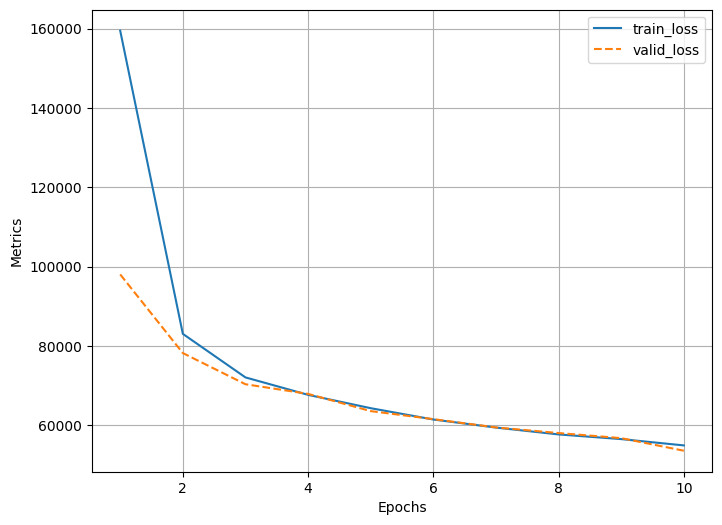

In [14]:
log.plot_epochs(['train_loss', 'valid_loss'])

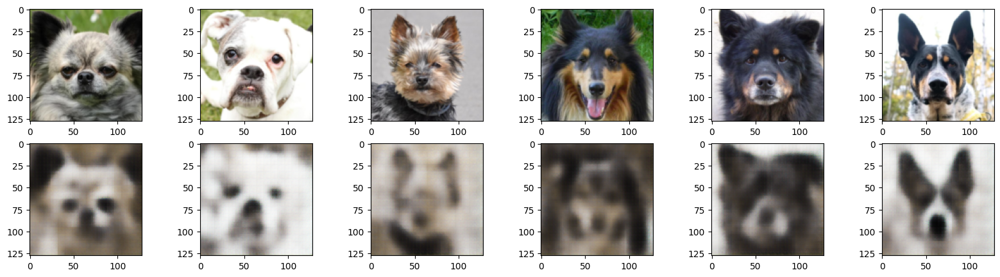

In [15]:
# See reconstructed images

with torch.no_grad():
    for images, labels in validLoader:
        recon_images, _, _ = model(images.to(device))
        break

    N = 6
    fig, axes = plt.subplots(2,N, figsize=(20,5))
    for i in range(N):
        axes[0,i].imshow(images[i].cpu().numpy().transpose(1,2,0).squeeze())
        axes[1,i].imshow(recon_images[i].cpu().numpy().transpose(1,2,0).squeeze())
        
    plt.show()

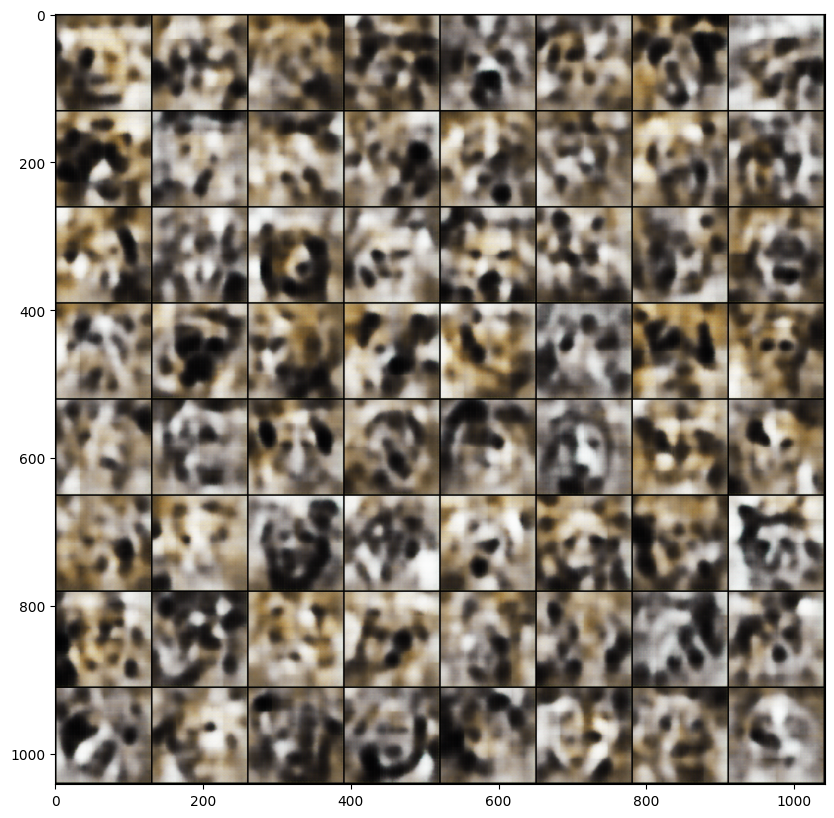

In [16]:
# plot new generated images
plt.figure(figsize=(10, 10))
with torch.no_grad():
    z = torch.randn(64, 256).to(device)
    samples = model.decoder(z).cpu()
    grid = make_grid(samples).permute(1, 2, 0)
    plt.imshow(grid)
    plt.show()